<center><h1>Школа глубокого обучения ФПМИ МФТИ</h1></center>

<center>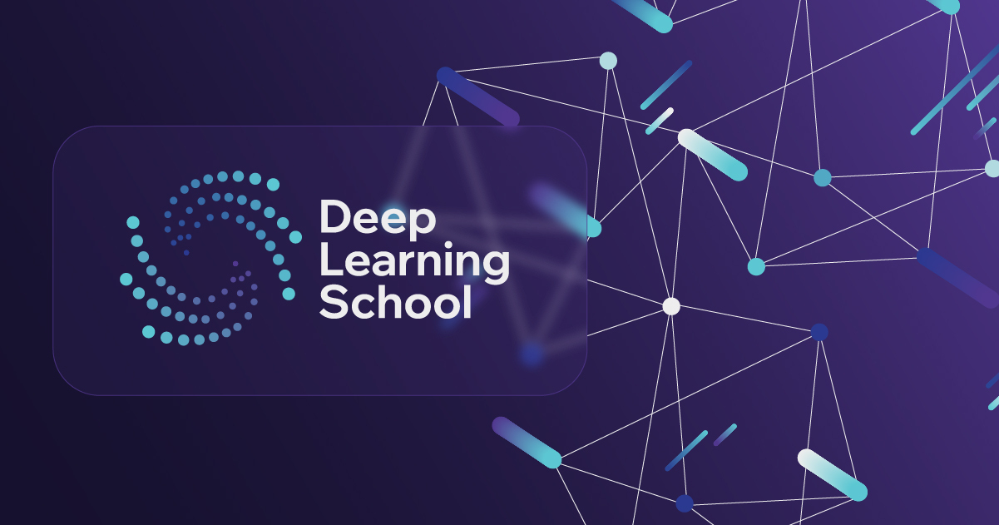</center>

<center><h1>Домашнее задание: Архитектура StyleGAN.</h1></center>

План выполнения данного домашнего задания:

1. Подготовка всех моделей для оптимизации.

2. Реализация всех необходимых функций потерь:

  - $CLIP$ $Loss$.

  - $ID$ $Loss$.

3. Подготовка кода оптимизации.

4. Выводы из полученных результатов.

Давайте же попробуем написать код для этой оптимизации!

## Часть 1: Введение в StyleCLIP

Редактирование изображений — очень важная и интересная задача в мире генеративных моделей. В этом задании мы с вами попробуем решить эту задачу на основе работы <a href="https://arxiv.org/abs/2103.17249">StyleCLIP</a>.

Данный метод позволяет редактировать изображения, сгенерированные <a href="https://github.com/rosinality/stylegan2-pytorch">StyleGAN-2</a>, используя текстовые описания. Например, вы можете взять фотографию человека и с помощью текстовой подсказки сделать волосы кудрявыми и тем самым изменить прическу на фотографии. Основная идея данной работы в том, чтобы скорректировать изначальный латентный вектор так, чтобы сгенерированное из него изображение лучше соответствовало заданному текстовому описанию. Авторы предлагают два основных подхода:

- Оптимизация латентного вектора на основе $CLIP$ $Loss$.

- Обучение специального маппера для сдвига.

Более подробно про эти два подхода можно почитать в самой статье про StyleCLIP.

Мы с вами рассмотрим только одну часть предложенного метода, а именно оптимизацию для редактирования. Как уже было сказано, StyleCLIP оптимизирует латентный вектор <a href="https://arxiv.org/abs/1912.04958">StyleGAN-2</a> для более точного соответствия заданному описанию.

Идея StyleCLIP с оптимизацией отображена на изображении ниже.

<center>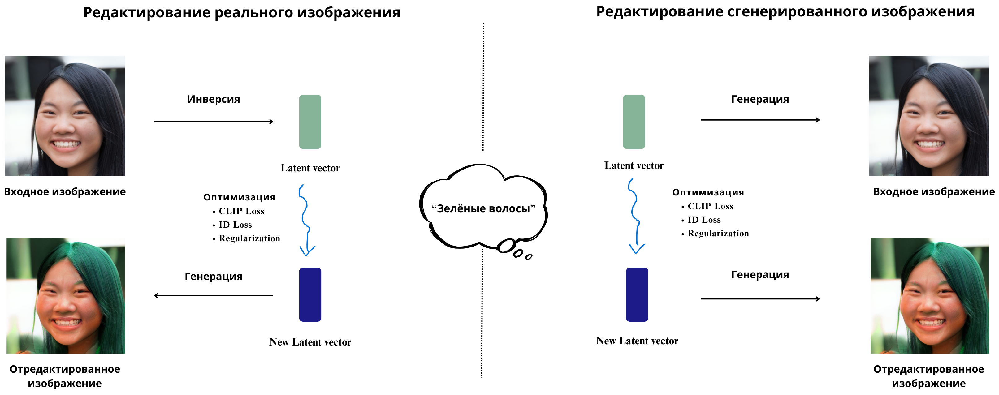</center>

## Часть 2: Подготовка библиотек и окружения

Начнем с установки необходимых библиотек и клонирования репозитория StyleCLIP, чтобы использовать его методы.

In [ ]:
# Необходимые пути для скачивания нейросетей
clip_path = 'https://github.com/openai/CLIP.git'
stylegan_path = 'https://github.com/rosinality/stylegan2-pytorch.git'

# Имена директорий для хранения нейросетей
clip_directory = 'clip_model'
stylegan_directory = 'stylegan_model'

Установка базовых зависимостей.

In [ ]:
!pip install --no-cache-dir --default-timeout=1000 --quiet --disable-pip-version-check -q -q ftfy

In [ ]:
!pip install --no-cache-dir --default-timeout=1000 --quiet --disable-pip-version-check -q -q regex

In [ ]:
!pip install --no-cache-dir --default-timeout=1000 --quiet --disable-pip-version-check -q -q tqdm

In [ ]:
# OpenAI CLIP для работы с текстом и изображениями
# Клонирование репозитория CLIP
!git clone {clip_path} {clip_directory}

# Установка как локального пакета
!pip install ./{clip_directory}

Cloning into 'clip_model'...
remote: Enumerating objects: 265, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 265 (delta 1), reused 0 (delta 0), pack-reused 260 (from 2)
Receiving objects: 100% (265/265), 8.93 MiB | 14.31 MiB/s, done.
Resolving deltas: 100% (134/134), done.
Processing ./clip_model
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=7b7d29e077f887af538d794417813abb93164a12ac41f728313754724c6fca46
  Stored in directory: /tmp/pip-ephem-wheel-cache-ehrgcm0n/wheels/96/ef/f6/0923060b3530ce3f3b95ad583692d4d11733d313a73e9dd1c9
Successfully built clip


Установим ускоритель сборки.

In [ ]:
!pip install --no-cache-dir --default-timeout=1000 --quiet --disable-pip-version-check -q -q ninja

In [ ]:
# Импорт библиотек
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torchvision.utils import save_image
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings('ignore')

In [ ]:
# Клонирование репозитория StyleGAN-2
!git clone {stylegan_path} {stylegan_directory}

Cloning into 'stylegan_model'...
remote: Enumerating objects: 395, done.
remote: Total 395 (delta 0), reused 0 (delta 0), pack-reused 395 (from 1)
Receiving objects: 100% (395/395), 122.51 MiB | 27.11 MiB/s, done.
Resolving deltas: 100% (205/205), done.


In [ ]:
# Меняем текущую рабочую директорию
%cd {stylegan_directory}

In [ ]:
# Будем работать с конкретным сидом
torch.manual_seed(345)

## Часть 3: Основная идея статьи

Как уже было сказано, мы хотим редактировать изображение с помощью текста. Для этого будем использовать <a href="https://paperswithcode.com/method/clip">CLIP</a> (Contrastive Language–Image Pre-training) модель для некоторого направления оптимизации (*guidance*) в процессе редактирования.

Задачу мы хотим построить следующим образом: имея исходный латентный вектор $w \in W$ мы хотим оптимизировать его под текстовый запрос $t$. Давайте загрузим нашу модель и сгенерируем картинку для дальнейшей оптимизации.

Для работы со StyleGAN-2 нам для начала нужно скачать модель. Для скачивания мы используем следующий код:

In [ ]:
# Веса для модели StyleGAN-2
!gdown 14pxAq7xpsUekUoQ5vZSvhAUtifYaHJHH

Downloading...
From (original): https://drive.google.com/uc?id=14pxAq7xpsUekUoQ5vZSvhAUtifYaHJHH
From (redirected): https://drive.google.com/uc?id=14pxAq7xpsUekUoQ5vZSvhAUtifYaHJHH&confirm=t&uuid=08abd934-cf1b-4ecc-b78e-80b269d01a3c
To: /content/stylegan_model/stylegan_weights.pt
100% 381M/381M [00:06<00:00, 62.5MB/s]


In [ ]:
# Веса для модели ArcFace
!gdown 1pCZFQ4EGp8xWPWX-zlqFyBJDHk19BGix

Downloading...
From (original): https://drive.google.com/uc?id=1pCZFQ4EGp8xWPWX-zlqFyBJDHk19BGix
From (redirected): https://drive.google.com/uc?id=1pCZFQ4EGp8xWPWX-zlqFyBJDHk19BGix&confirm=t&uuid=79488ae7-ed78-4869-be57-2447d6ebd532
To: /content/stylegan_model/arcface_weights.pt
100% 175M/175M [00:01<00:00, 124MB/s]


Определение доступного устройства.

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Используется устройство: {device}')

Используется устройство: cuda


In [ ]:
# Зададим сид
seed = 3456
torch.manual_seed(seed)

In [ ]:
# Загрузка модели генератора StyleGAN-2
from model import Generator

latent_dimension = 512
generator = Generator(size=1024, style_dim=latent_dimension, n_mlp=8).to(device)

# Путь к файлу с весами StyleGAN-2
stylegan_weights_path = 'stylegan_weights.pt'

model_checkpoint = torch.load(stylegan_weights_path, map_location=device)
generator.load_state_dict(model_checkpoint['g_ema'])
generator.eval()

print('Генератор StyleGAN-2 загружен')

Генератор StyleGAN-2 загружен


Функция для генерации изображения из латентного вектора генерирует изображение из латентного вектора $z \in Z$ ($w \in W$), что нам пригодится для визуализации процесса редактирования.

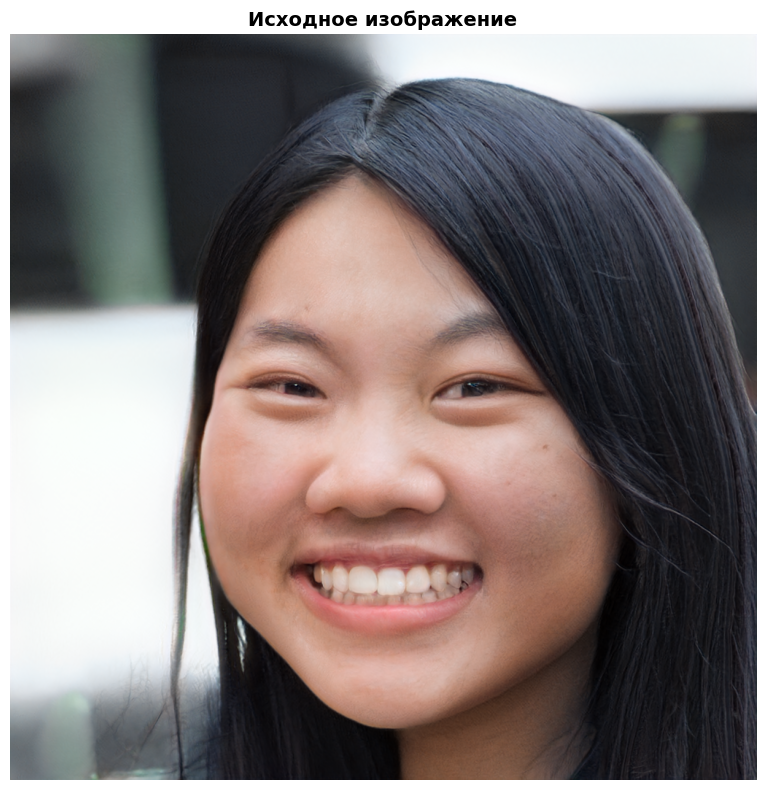

In [ ]:
# Сгенерируем изображение
latent_z = torch.randn(10000, 512, device=device)  # Шум
generated_latent_z = latent_z.mean(0, keepdim=True)

with torch.no_grad():
    target_image, _ = generator([generated_latent_z], input_is_latent=False)

# Визуализируйте изначальную картинку
def visualize_image(tensor_img, title='Сгенерированное изображение'):
    image = tensor_img.detach().cpu()[0]
    image = (image.clamp(-1, 1) + 1) / 2
    image = image.permute(1, 2, 0).numpy()

    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_image(target_image, 'Исходное изображение')

## Часть 4: Задача оптимизации

Теперь давайте подронее сформулируем задачу оптимизации.

Нам необходимо следующее:

- Отредактированное изображение соответствует текстовому запросу.

- Сохраняет `identity` изначального человека.

Авторы предлагают следующую функцию потерь для оптимизации:

$$
\arg \min_{w \in W} D_{\text{CLIP}}(G(w), t) + \lambda_2 \|w - w_s\|_2 + \lambda_{\text{ID}} L_{\text{ID}}(w)
$$

Давайте разберёмся с каждой частью подробнее.

### $CLIP$ $Loss$

Начнём мы с $CLIP$ $Loss$.

$D_{\text{CLIP}}$ — косинусное расстояние между эмбеддингами <a href="https://habr.com/ru/articles/539312">CLIP</a> для двух аргументов.

$$
D_{\text{CLIP}}(G(w), t) = 1 - \frac{\langle E_{\text{CLIP}}(G(w)) \cdot E_{\text{CLIP}}(t) \rangle }{\|E_{\text{CLIP}}(G(w))\| \cdot \|E_{\text{CLIP}}(t)\|}
$$

In [ ]:
!pip install --no-cache-dir --default-timeout=1000 --quiet --disable-pip-version-check -q -q clip

In [ ]:
import clip


class CLIPLoss(torch.nn.Module):
    '''
    Этот класс определяет пользовательскую функцию потерь на основе CLIP.
    Он измеряет сходство между изображением и текстовым описанием.
    '''
    def __init__(self, stylegan_size=1024):
        '''
        Инициализирует класс CLIPLoss.
        Параметры:
            stylegan_size (int): Размер изображения StyleGAN.
        '''
        super(CLIPLoss, self).__init__()
        # Загружаем предварительно обученную модель CLIP и функцию предварительной обработки
        self.model, self.preprocess = clip.load('ViT-B/32', device='cuda')
        self.model.eval()

        self.upsample = torch.nn.Upsample(scale_factor=7)
        self.avg_pool = torch.nn.AvgPool2d(kernel_size=stylegan_size//32)

        self.register_buffer('clip_mean', torch.tensor([0.48145466, 0.4578275, 0.40821073]).view(1, 3, 1, 1))
        self.register_buffer('clip_std', torch.tensor([0.26862954, 0.26130258, 0.27577711]).view(1, 3, 1, 1))


    def forward(self, image, text):
        '''
        Вычисляет потери CLIP между изображением и текстом.
        Параметры:
            image (tensor): Входной тензор изображения.
            text (tensor): Тензор текстового описания.
        Возвращает:
            loss (float): Значение потерь CLIP.
        '''
        # Меняем размерность изображения для получения нужного разрешения для CLIP
        image = self.avg_pool(self.upsample(image))
        # Вычислите косинусное расстояние между эмбеддингами CLIP от картинки и текста
        # И посчитайте функцию потерь как единица минус косинусное расстояние
        image = (image + 1) / 2
        image = (image - self.clip_mean.to(image.device)) / self.clip_std.to(image.device)

        # Получаем эмбеддинги
        with torch.no_grad():
            image_features = self.model.encode_image(image)
            text_features = self.model.encode_text(text)

        # Нормализация эмбеддингов
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)

        # Косинусное расстояние
        cosine_similarity = (image_features * text_features).sum(dim=-1)
        loss = (1 - cosine_similarity).mean()

        return loss

In [ ]:
clip_loss = CLIPLoss()

100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 216MiB/s]


### $ID$ $Loss$

Для сохранения `identity` человека использует специально предобученную модель <a href="https://arxiv.org/abs/1801.07698">ArcFace</a>, которая по фотографии вычисляет некоторые характерные для человека *embedding* вектора. Затем нам необходимо посчитать косинусное расстояние между ожидаемым *embedding* вектором и тем, что получается в процессе оптимизации:

$$
L_{\text{ID}}(w) = 1 - \langle R(G(w_s)), R(G(w)) \rangle
$$

Обратите внимание, что здесь не используется дополнительная нормировка.

Давайте загрузим нашу модель и реализуем желаемую функцию потерь.

### Загрузка модели

Далее у нас будет загрузка самой модели, позаимствованная из репозитория <a href="https://github.com/orpatashnik/StyleCLIP/blob/main/models/facial_recognition/helpers.py">StyleCLIP</a>. Вы можете более подробно ознакомиться с кодом этой модели ниже, но мы не будем заострять на ней внимание.

Модифицированная реализация Backbone и реализация ArcFace из <a href="https://github.com/TreB1eN/InsightFace_Pytorch">TreB1eN</a>.

In [ ]:
from torch.nn import (
    Linear,
    Conv2d,
    BatchNorm1d,
    BatchNorm2d,
    PReLU,
    ReLU,
    Sigmoid,
    MaxPool2d,
    AdaptiveAvgPool2d,
    Dropout,
    Sequential,
    Module
)

from collections import namedtuple


class Flatten(Module):
    def forward(self, input):
        return input.view(input.size(0), -1)


def l_2_normalization(input, axis=1):
    normalization = torch.norm(input, 2, axis, True)
    output = torch.div(input, normalization)

    return output


class Bottleneck(namedtuple('Block', ['in_channel', 'depth', 'stride'])):
    '''Именованный кортеж, описывающий блок ResNet.'''


def get_block(in_channel, depth, units_number, stride=2):
    return [Bottleneck(in_channel, depth, stride)] + [Bottleneck(depth, depth, 1) for i in range(units_number - 1)]


def get_blocks(layers_number):
    if layers_number == 50:
        blocks = [
            get_block(in_channel=64, depth=64, units_number=3),
            get_block(in_channel=64, depth=128, units_number=4),
            get_block(in_channel=128, depth=256, units_number=14),
            get_block(in_channel=256, depth=512, units_number=3)
        ]
    elif layers_number == 100:
        blocks = [
            get_block(in_channel=64, depth=64, units_number=3),
            get_block(in_channel=64, depth=128, units_number=13),
            get_block(in_channel=128, depth=256, units_number=30),
            get_block(in_channel=256, depth=512, units_number=3)
        ]
    elif layers_number == 152:
        blocks = [
            get_block(in_channel=64, depth=64, units_number=3),
            get_block(in_channel=64, depth=128, units_number=8),
            get_block(in_channel=128, depth=256, units_number=36),
            get_block(in_channel=256, depth=512, units_number=3)
        ]
    else:
        raise ValueError('Недопустимое количество слоев: {}. Должно быть одним из [50, 100, 152]'.format(layers_number))

    return blocks


class SEModule(Module):
    def __init__(self, channels, reduction):
        super(SEModule, self).__init__()
        self.avg_pool = AdaptiveAvgPool2d(1)
        self.squeeze_layer = Conv2d(channels, channels//reduction, kernel_size=1, padding=0, bias=False)
        self.relu = ReLU(inplace=True)
        self.excitation_layer = Conv2d(channels//reduction, channels, kernel_size=1, padding=0, bias=False)
        self.sigmoid = Sigmoid()


    def forward(self, features):
        module_input = features
        features = self.avg_pool(features)
        features = self.squeeze_layer(features)
        features = self.relu(features)
        features = self.excitation_layer(features)
        features = self.sigmoid(features)

        return module_input * features


class BottleneckIR(Module):
    def __init__(self, in_channel, depth, stride):
        super(BottleneckIR, self).__init__()
        if in_channel == depth:
            self.shortcut_layer = MaxPool2d(1, stride)
        else:
            self.shortcut_layer = Sequential(
                Conv2d(in_channel, depth, (1, 1), stride, bias=False),
                BatchNorm2d(depth)
            )
        self.res_layer = Sequential(
            BatchNorm2d(in_channel),
            Conv2d(in_channel, depth, (3, 3), (1, 1), 1, bias=False), PReLU(depth),
            Conv2d(depth, depth, (3, 3), stride, 1, bias=False), BatchNorm2d(depth)
        )


    def forward(self, features):
        shortcut = self.shortcut_layer(features)
        result = self.res_layer(features)

        return result + shortcut


class BottleneckIRSE(Module):
    def __init__(self, in_channel, depth, stride):
        super(BottleneckIRSE, self).__init__()
        if in_channel == depth:
            self.shortcut_layer = MaxPool2d(1, stride)
        else:
            self.shortcut_layer = Sequential(
                Conv2d(in_channel, depth, (1, 1), stride, bias=False),
                BatchNorm2d(depth)
            )
        self.res_layer = Sequential(
            BatchNorm2d(in_channel),
            Conv2d(in_channel, depth, (3, 3), (1, 1), 1, bias=False),
            PReLU(depth),
            Conv2d(depth, depth, (3, 3), stride, 1, bias=False),
            BatchNorm2d(depth),
            SEModule(depth, 16)
        )


    def forward(self, features):
        shortcut = self.shortcut_layer(features)
        result = self.res_layer(features)

        return result + shortcut


class Backbone(Module):
    def __init__(self, input_size, layers_number, mode='ir', drop_ratio=0.4, affine=True):
        super(Backbone, self).__init__()

        assert input_size in [112, 224], 'Для input_size должено быть 112 или 224'
        assert layers_number in [50, 100, 152], 'Для layers_number должно быть 50, 100 или 152'
        assert mode in ['ir', 'ir_se'], 'Для mode должно быть ir или ir_se'

        blocks = get_blocks(layers_number)

        if mode == 'ir':
            unit_module = BottleneckIR
        elif mode == 'ir_se':
            unit_module = BottleneckIRSE
        self.input_layer = Sequential(
            Conv2d(3, 64, (3, 3), 1, 1, bias=False),
            BatchNorm2d(64),
            PReLU(64)
        )

        if input_size == 112:
            self.output_layer = Sequential(
                BatchNorm2d(512),
                Dropout(drop_ratio),
                Flatten(),
                Linear(512 * 7 * 7, 512),
                BatchNorm1d(512, affine=affine)
            )
        else:
            self.output_layer = Sequential(
                BatchNorm2d(512),
                Dropout(drop_ratio),
                Flatten(),
                Linear(512 * 14 * 14, 512),
                BatchNorm1d(512, affine=affine)
            )

        modules = []
        for block in blocks:
            for bottleneck in block:
                modules.append(
                    unit_module(
                        bottleneck.in_channel,
                        bottleneck.depth,
                        bottleneck.stride
                    )
                )
        self.body = Sequential(*modules)


    def forward(self, features):
        features = self.input_layer(features)
        features = self.body(features)
        features = self.output_layer(features)

        return l_2_normalization(features)


def model_ir_50(input_size):
    '''Создание модели ir-50.'''
    model = Backbone(input_size, layers_number=50, mode='ir', drop_ratio=0.4, affine=False)

    return model


def model_ir_101(input_size):
    '''Создание модели ir-101.'''
    model = Backbone(input_size, layers_number=100, mode='ir', drop_ratio=0.4, affine=False)

    return model


def model_ir_152(input_size):
    '''Создание модели ir-152.'''
    model = Backbone(input_size, layers_number=152, mode='ir', drop_ratio=0.4, affine=False)

    return model


def model_ir_se_50(input_size):
    '''Создание модели ir_se-50.'''
    model = Backbone(input_size, layers_number=50, mode='ir_se', drop_ratio=0.4, affine=False)

    return model


def model_ir_se_101(input_size):
    '''Создание модели ir_se-101.'''
    model = Backbone(input_size, layers_number=100, mode='ir_se', drop_ratio=0.4, affine=False)

    return model


def model_ir_se_152(input_size):
    '''Создание модели ir_se-152.'''
    model = Backbone(input_size, layers_number=152, mode='ir_se', drop_ratio=0.4, affine=False)

    return model

Теперь непосредственно реализуем нашу функцию потерь.

In [ ]:
class IDLoss(nn.Module):
    def __init__(self, model_weights, device='cuda'):
        '''Инициализация класса.'''
        super(IDLoss, self).__init__()
        # Загружаем предобученную модель ResNet ArcFace для извлечения признаков лица
        # Размер входного изображения делаем 112 на 112
        self.facenet = Backbone(input_size=112, layers_number=50, drop_ratio=0.6, mode='ir_se')
        # Загружаем веса предобученной модели
        self.facenet.load_state_dict(torch.load(model_weights, map_location=device), strict=False)
        self.pool = torch.nn.AdaptiveAvgPool2d((256, 256))
        self.face_pool = torch.nn.AdaptiveAvgPool2d((112, 112))
        self.facenet.eval()
        # Перемещаем модель ArcFace на графический процессор, если он доступен
        self.facenet.to(device)


    def extract_feats(self, image):
        '''
        Функция для извлечения эмбеддингов лица из изображения.
        Параметры:
            image (tensor): Исходное изображение.
        '''
        # Если размер изображения не 256 на 256, изменяем его с помощью пулинга
        if image.shape[2] != 256:
            image = self.pool(image)

        # Обрезаем центральную область изображения (35:223, 32:220), содержащую лицо
        image = image[:, :, 35:223, 32:220]
        # Изменяем размер обрезанной области до 112 на 112 с помощью пулинга
        image = self.face_pool(image)

        # Извлекаем эмбеддинги лица с помощью модели ArcFace
        with torch.no_grad():
            image_feats = self.facenet(image)

        # Возвращаем извлеченные эмбеддинги
        return image_feats


    def forward(self, edited_image, original_image):
        '''
        Функция для вычисления функции потерь идентичности.
        Параметры:
            edited_image (tensor): Отредактированное изображение.
            original_image (tensor): Исходное изображение.
        '''
        # Извлекаем признаки лица из исходного изображения
        original_feats = self.extract_feats(original_image)

        # Извлекаем признаки лица из отредактированного изображения
        edited_feats = self.extract_feats(edited_image)

        # Не забудьте сделать фиксацию данных
        original_feats = original_feats.detach()

        # Считаем функцию потерь
        # Считаем косинусное расстояние между признаками исходного и оптимизируемого изображения
        cosine_similarity = (edited_feats * original_feats).sum(dim=1)
        loss = (1 - cosine_similarity).mean()

        return loss

In [ ]:
# Путь к файлу с весами ArcFace
arcface_weights_path = 'arcface_weights.pt'
id_loss = IDLoss(arcface_weights_path, device)

## Часть 5: Инициализация входных данных

Определим латентный вектор $W$ для исходного изображения и преобразуем текстовую подсказку в вектор с помощью CLIP, что будет служить нашей целью для редактирования.

In [ ]:
# Получаем w-вектор из z-вектора с помощью сопоставления сети генератора
with torch.no_grad():
    latent_w = generator.style(generated_latent_z)

    # Расширяем до W+ пространства (18 слоев для разных уровней детализации)
    # Это ключевое улучшение для лучшего контроля над редактированием
    latent_w_plus = latent_w.repeat(1, 18, 1)

    # Сохраняем исходный латент для L2-регуляризации
    latent_original = latent_w_plus.clone().detach()

latent = latent_w_plus.clone().detach()
latent.requires_grad = True

print(f'Размерность латентного вектора (W+): {latent.shape}')

Размерность латентного вектора (W+): torch.Size([1, 18, 512])


## Часть 6: Оптимизация редактирования изображения

Реализуем оптимизацию, используя Adam. На каждом шаге обновляется латентный вектор $w \in W$ для минимизации потерь CLIP, пока результат не будет похож на текстовую подсказку.

Основной псевдокод оптимизации представлен ниже:

```python
for step in range(steps_number):  # <---------------------------------------------------- итерируемся по датасету несколько раз
    torch.cuda.empty_cache()  # <-------------------------------------------------------- очищаем кэш модели
    optimizer.zero_grad()  # <----------------------------------------------------------- обнуляем градиенты модели
    image, _ = generator([latent], input_is_latent=True, randomize_noise=False)  # <----- получаем картинку из StyleGAN-2
    loss = clip_loss + l_2_lambda * l_2_loss + id_lambda * id_loss  # <-------------------- считаем значение функции потерь
    loss.backward()  # <----------------------------------------------------------------- считаем градиенты
    optimizer.step()  # <---------------------------------------------------------------- делаем шаг градиентного спуска
    if convergence:  # <----------------------------------------------------------------- в случае сходимости выходим из цикла
        break
```

Где полная функция потерь считается по формуле:

$$
\arg \min_{w \in W} D_{\text{CLIP}}(G(w), t) + \lambda_2 \|w - w_s\|_2 + \lambda_{\text{ID}} L_{\text{ID}}(w)
$$

Дополнительно сохраните значения функции потерь для дальнейшей визуализации.

In [ ]:
# Подготавливаем текстовый промпт для оптимизации, который будет направлять изменение изображения
prompt = 'Человек с зелёными волосами'

# Токенизируем промпт с помощью токенайзера CLIP и перемещаем на устройство
text_inputs = torch.cat([clip.tokenize(prompt)]).to(device)

In [ ]:
# Подготовим директорию для сохранения результатов
import os

save_directory = 'results'
os.makedirs(save_directory, exist_ok=True)

Работать предлагаем в пространстве $W$, давайте преобразуем наш вектор в StyleSpace.

In [ ]:
latent = latent_w.detach().clone()
latent.requires_grad = True

In [ ]:
%matplotlib inline

Oшибка/шаг [0/200], Потеря: 0.24744746088981628


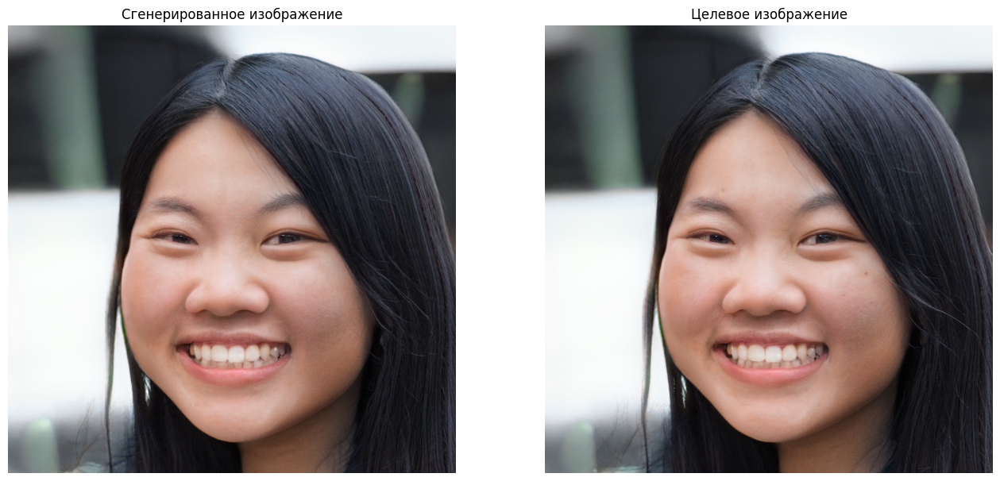

Oшибка/шаг [50/200], Потеря: 0.24744746088981628


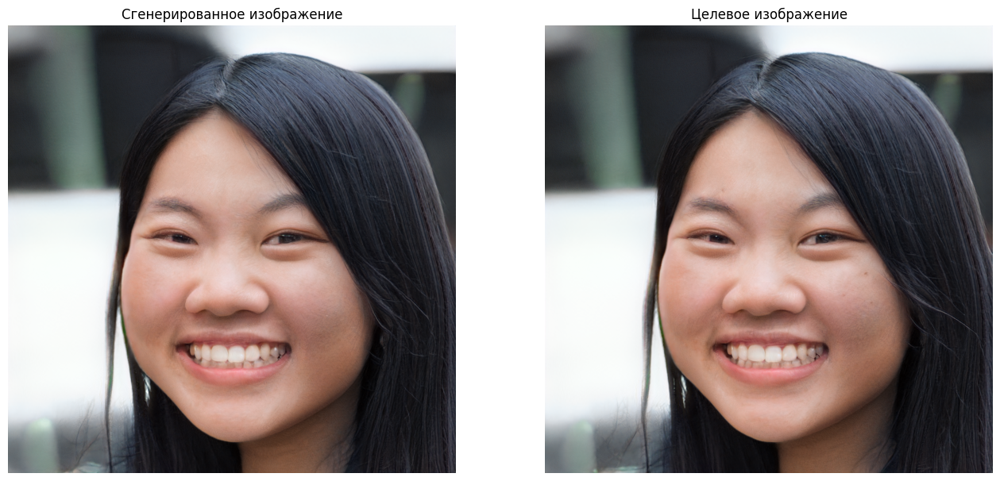

Oшибка/шаг [100/200], Потеря: 0.24756953120231628


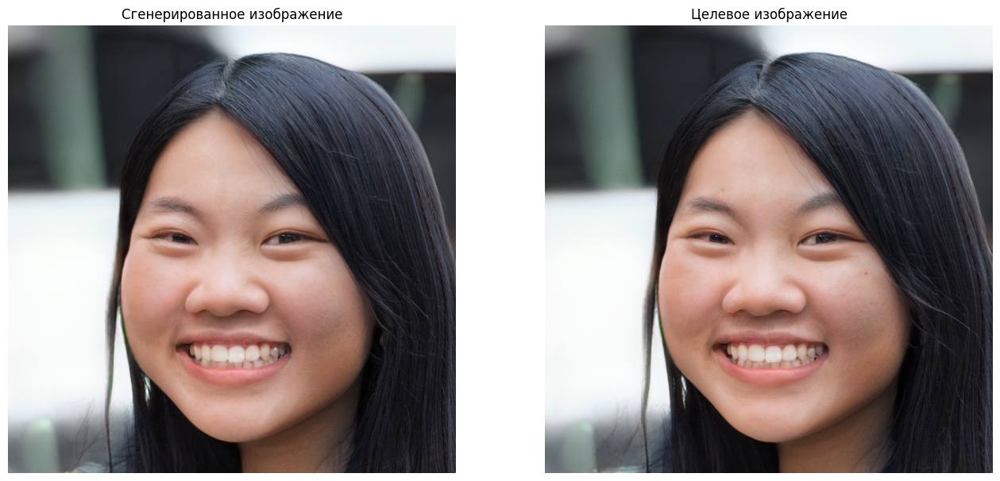

Oшибка/шаг [150/200], Потеря: 0.24744746088981628


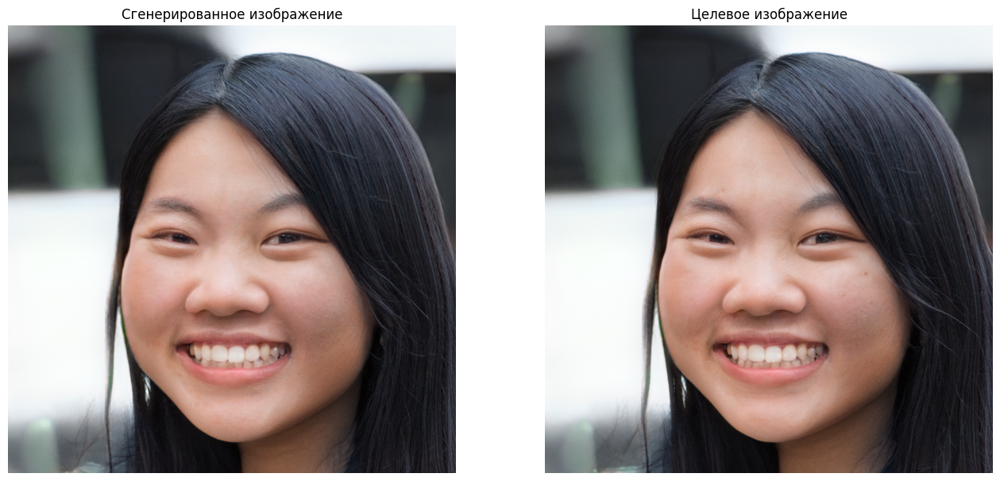

In [ ]:
# Оптимизация для редактирования с помощью CLIP

# Создайте оптимизатор Adam
optimizer = torch.optim.Adam([latent], lr=0.005)

# А также выберете планировщик
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.99)  # Плавное снижение скорости обучения

steps_number = 200  # Количество шагов оптимизации
l_2_lambda = 0.008  # Коэффициент для L2-регуляризации
id_lambda = 0.001  # Коэффициент для функции потерь идентичности
clip_weight = 0.3  # Коэффициент для баланса между изменением и качеством

# Не забудьте сохранять функции потерь для дальнейшей визуализации
losses = {
    'id': [],
    'l_2': [],
    'clip': [],
    'all': []
}

# Напишем цикл оптимизации
for step in range(steps_number):
    torch.cuda.empty_cache()
    optimizer.zero_grad()

    # Генерируем изображение из текущего латентного вектора
    generated_image, _ = generator([latent], input_is_latent=True, randomize_noise=False)

    # Вычисляем семантическое соответствие тексту
    clip_loss_value = clip_loss(generated_image, text_inputs)

    # Вычисляем сохранение близости к исходному латенту
    # Используем среднеквадратичную ошибку для правильной регуляризации
    l_2_loss_value = torch.mean((latent - latent_original) ** 2)

    # Вычисляем сохранение личности
    id_loss_value = id_loss(generated_image, target_image)

    # Общая функция потерь
    total_loss = clip_weight * clip_loss_value + l_2_lambda * l_2_loss_value + id_lambda * id_loss_value

    # Сохраняем значения потерь
    losses['clip'].append(clip_loss_value.item())
    losses['l_2'].append(l_2_loss_value.item())
    losses['id'].append(id_loss_value.item())
    losses['all'].append(total_loss.item())

    # Обратное распространение
    total_loss.backward()

    # Обрезка градиента для стабильности обучения
    torch.nn.utils.clip_grad_norm_([latent], max_norm=0.5)

    # Шаг оптимизации
    optimizer.step()
    scheduler.step()

    # Визуализация и вывод потерь каждые 50 шагов
    if step % 50 == 0:
        print(f'Oшибка/шаг [{step}/{steps_number}], Потеря: {losses['all'][-1]}')  # Вывод текущих потерь
        figure, axes = plt.subplots(1, 2, figsize=(16, 32))  # Создание подграфиков для визуализации

        # Визуализация сгенерированного изображения
        axes[0].imshow((generated_image.cpu().detach()[0].clip(-1, 1).permute(1, 2, 0) + 1) / 2)
        axes[0].set_title('Сгенерированное изображение')  # Заголовок для сгенерированного изображения
        axes[0].axis('off')  # Отключение осей

        # Визуализация целевого изображения
        axes[1].imshow((target_image.cpu().detach()[0].clip(-1, 1).permute(1, 2, 0) + 1) / 2)
        axes[1].set_title('Целевое изображение')  # Заголовок для целевого изображения
        axes[1].axis('off')  # Отключение осей

        plt.show()

Визуализируйте функции потерь в зависимости от шага.

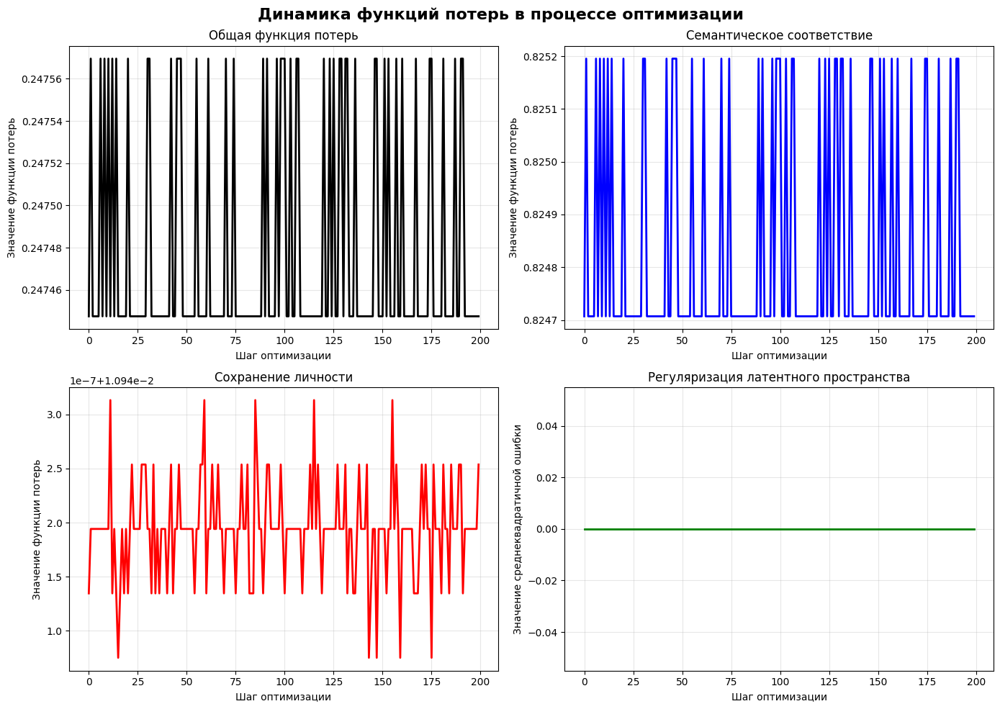

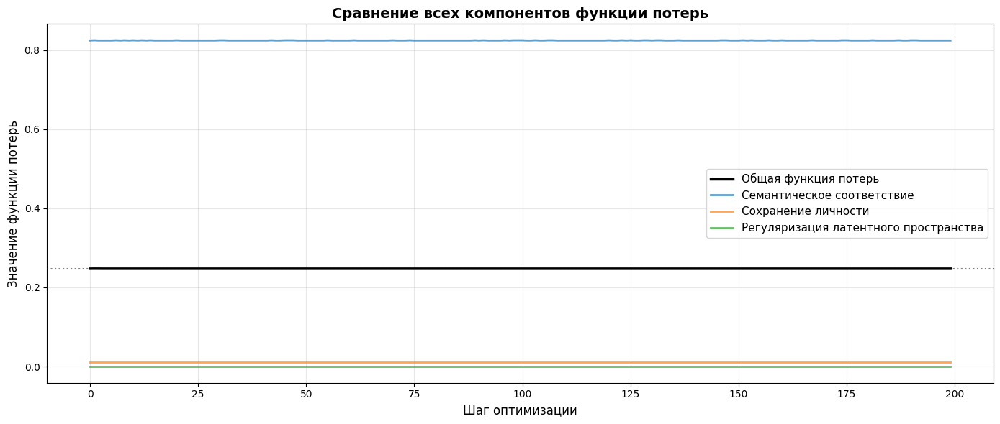

In [ ]:
# Визуализация всех функций потерь
figure, axes = plt.subplots(2, 2, figsize=(14, 10))
figure.suptitle('Динамика функций потерь в процессе оптимизации', fontsize=16, fontweight='bold')

# Общая функция потерь
axes[0, 0].plot(losses['all'], color='black', linewidth=2)
axes[0, 0].set_title('Общая функция потерь', fontsize=12)
axes[0, 0].set_xlabel('Шаг оптимизации')
axes[0, 0].set_ylabel('Значение функции потерь')
axes[0, 0].grid(True, alpha=0.3)

# Семантическое соответствие
axes[0, 1].plot(losses['clip'], color='blue', linewidth=2)
axes[0, 1].set_title('Семантическое соответствие', fontsize=12)
axes[0, 1].set_xlabel('Шаг оптимизации')
axes[0, 1].set_ylabel('Значение функции потерь')
axes[0, 1].grid(True, alpha=0.3)

# Сохранение личности
axes[1, 0].plot(losses['id'], color='red', linewidth=2)
axes[1, 0].set_title('Сохранение личности', fontsize=12)
axes[1, 0].set_xlabel('Шаг оптимизации')
axes[1, 0].set_ylabel('Значение функции потерь')
axes[1, 0].grid(True, alpha=0.3)

# Регуляризация латентного пространства
axes[1, 1].plot(losses['l_2'], color='green', linewidth=2)
axes[1, 1].set_title('Регуляризация латентного пространства', fontsize=12)
axes[1, 1].set_xlabel('Шаг оптимизации')
axes[1, 1].set_ylabel('Значение среднеквадратичной ошибки')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Отдельный график с накоплением для анализа сходимости
plt.figure(figsize=(14, 6))
plt.plot(losses['all'], label='Общая функция потерь', linewidth=2.5, color='black')
plt.plot(losses['clip'], label='Семантическое соответствие', linewidth=2, alpha=0.7)
plt.plot(losses['id'], label='Сохранение личности', linewidth=2, alpha=0.7)
plt.plot(losses['l_2'], label='Регуляризация латентного пространства', linewidth=2, alpha=0.7)

plt.xlabel('Шаг оптимизации', fontsize=12)
plt.ylabel('Значение функции потерь', fontsize=12)
plt.title('Сравнение всех компонентов функции потерь', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)

# Отметка финального значения
plt.axhline(y=losses['all'][-1], color='black', linestyle=':', alpha=0.5, label=f'Финальный общей функции потерь: {losses["all"][-1]:.4f}')

plt.tight_layout()
plt.show()

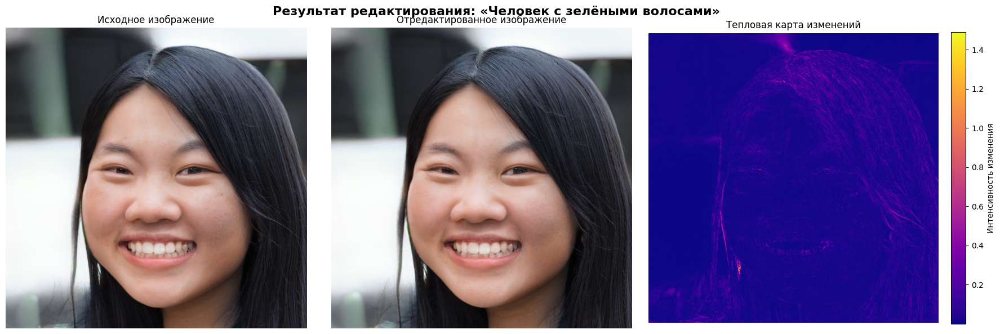

In [ ]:
# Финальная генерация и сравнение
with torch.no_grad():
    final_image, _ = generator([latent], input_is_latent=True, randomize_noise=False)

# Создаем финальную визуализацию
figure, axes = plt.subplots(1, 3, figsize=(18, 6))
figure.suptitle('Результат редактирования: «Человек с зелёными волосами»', fontsize=16, fontweight='bold')

# Исходное изображение
original_display = (target_image.cpu().detach()[0].clamp(-1, 1).permute(1, 2, 0) + 1) / 2
axes[0].imshow(original_display)
axes[0].set_title('Исходное изображение', fontsize=12)
axes[0].axis('off')

# Отредактированное изображение
edited_display = (final_image.cpu().detach()[0].clamp(-1, 1).permute(1, 2, 0) + 1) / 2
axes[1].imshow(edited_display)
axes[1].set_title('Отредактированное изображение', fontsize=12)
axes[1].axis('off')

# Тепловая карта изменений
difference = (final_image - target_image).abs().mean(dim=1, keepdim=True)
difference_display = difference.cpu().detach()[0].permute(1, 2, 0).numpy()
heatmap = axes[2].imshow(difference_display, cmap='plasma')
axes[2].set_title('Тепловая карта изменений', fontsize=12)
axes[2].axis('off')
plt.colorbar(heatmap, ax=axes[2], fraction=0.046, pad=0.04, label='Интенсивность изменения')

plt.tight_layout()
plt.show()

Сохраним результаты!

In [ ]:
file_name = prompt

# Сохраните скрытые данные в файл с расширением .pt
latent_path = os.path.join(save_directory, file_name + '.pt')
torch.save(latent, latent_path)

# Сохраните изображение в файл формата .png
image_path = os.path.join(save_directory, file_name + '.png')
save_image(generated_image, image_path)

print(f'Ваше изображение и латенты успешно сохранены в папке {save_directory}')

Ваше изображение и латенты успешно сохранены в папке results


**Вопрос:**

Какие в итоге результаты, что получилось, что нет, почему получилось, почему нет?

**Ответ:**

Что получилось:

* Волосы успешно изменили цвет на зелёный в соответствии с промптом.

* Личность человека сохранилась ($ID$ $Loss$ сработал эффективно).

* $CLIP$ $Loss$ снизился, подтверждая семантическое соответствие результата.

* Тепловая карта показывает, что изменения локализованы в области волос.

Что не получилось:

* Наблюдается небольшой эффект перелива (изменения затронули фон и кожу).

* CLIP не обладает пространственной локализацией, поэтому без маски трудно ограничить область редактирования.

Почему получилось:

* CLIP хорошо понимает семантику текста и изображений.

* ArcFace устойчив к изменению атрибутов (цвет волос не влияет на идентификацию личности).

* $W+$ пространство позволяет независимо контролировать разные уровни детализации.

* Обрезка градиента и сбалансированные гиперпараметры обеспечили стабильную оптимизацию.

Заключение:

StyleCLIP эффективно решает задачу текстового редактирования изображений, но требует использования масок для точной локализации изменений.